# Importing Necessary Libraries

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import numpy as np
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from albumentations import HorizontalFlip, VerticalFlip, Rotate
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

# Creating The U_Net Model

In [2]:
class DoubleConv(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(DoubleConv,self).__init__()
        self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels,3,1,1,bias = False), #stride=1,padding=1, so output size will be same as input , only number of channels will differ
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
        nn.Conv2d(out_channels, out_channels,3,1,1,bias = False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
        )
    def forward(self,x):
        return self.conv(x)
    
class encoder_block(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(encoder_block,self).__init__()
        self.c = DoubleConv(in_channels,out_channels)
        self.p = nn.MaxPool2d(kernel_size=2,stride=2)  # halves the spatial dimension both in height and width

    def forward(self,x):
        x = self.c(x)
        return x,self.p(x)  #we need x for the skip connections
    
class decoder_block(nn.Module):
    def __init__(self,in_channels,out_channels):
        super(decoder_block,self).__init__()
        self.up = nn.ConvTranspose2d(in_channels,out_channels,kernel_size=2,stride=2,padding=0)
        self.dc = DoubleConv(out_channels+out_channels,out_channels)
        
    def forward(self,x,skip):
        x = self.up(x)
        x = torch.cat([x,skip],dim=1)
        x = self.dc(x)
        return x
    
class U_Net(nn.Module):
    def __init__(self):
        super(U_Net,self).__init__()
        
        #Encoder
        self.e1 = encoder_block(3,64)
        self.e2 = encoder_block(64,128)
        self.e3 = encoder_block(128,256)
        self.e4 = encoder_block(256,512)
        
        #Bottleneck
        self.b = DoubleConv(512,1024)
        
        #Decoder
        self.d1 = decoder_block(1024,512)
        self.d2 = decoder_block(512,256)
        self.d3 = decoder_block(256,128)
        self.d4 = decoder_block(128,64)
        
        #Pixel Classifier
        self.classifier = nn.Conv2d(64,1,kernel_size=1)
        
    def forward(self,input):
        #Encoder
        s1,x = self.e1(input)
        s2,x = self.e2(x)
        s3,x = self.e3(x)
        s4,x = self.e4(x)
        
        #Bottleneck
        b = self.b(x)
        
        #Decoder
        output = self.d1(b,s4)
        output = self.d2(output,s3)
        output = self.d3(output,s2)
        output = self.d4(output,s1)
        
        #Pixel classifier
        output = self.classifier(output)
        return output
    
if __name__ == "__main__":
    x = torch.randn((2, 3, 512, 512))
    f = U_Net()
    y = f(x)
    print(y.shape)

torch.Size([2, 1, 512, 512])


# Loss Function

In [3]:
class DiceBCELoss(nn.Module):
    def __init__(self):
        super(DiceBCELoss,self).__init__()
    
    def forward(self,inputs,targets,smooth=1):  #smooth is for avoiding division by zero error
        outputs = torch.sigmoid(inputs)
        
        #flatten the outputs and targets tensors
        outputs = outputs.view(-1)
        targets = targets.view(-1)
        
        #calculating the dice loss
        intersection = (outputs*targets).sum()
        dice_loss = 1-(2.*intersection+smooth)/(outputs.sum()+targets.sum()+smooth) #. is for floating point opearation
        
        #calculating BCE loss
        BCE = F.binary_cross_entropy(outputs,targets,reduction='mean')
        
        Dice_BCE = BCE + dice_loss
        return Dice_BCE
        

# Loading The Dataset

In [4]:
def load_data(folder_path):
    files = []
    # Iterate through files in the folder
    for filename in sorted(os.listdir(folder_path)):
        file_path = os.path.join(folder_path, filename)
        # Open the file
        with Image.open(file_path) as img:
            # Convert img to NumPy array
            data = np.array(img)
            # Append the NumPy array to the list
            files.append(data)
    return np.array(files)


train_img , train_mask = load_data('/kaggle/input/drive2004/DRIVE/training/images'), load_data('/kaggle/input/drive2004/DRIVE/training/1st_manual')
test_img, test_mask = load_data('/kaggle/input/drive2004/DRIVE/test/images'), load_data('/kaggle/input/drive2004/DRIVE/test/1st_manual')
print('Train images shape:{}'.format(train_img.shape))
print('Train masks shape:{}'.format(train_mask.shape))
print('Test images shape:{}'.format(test_img.shape))
print('Test masks shape:{}'.format(test_mask.shape))

Train images shape:(20, 584, 565, 3)
Train masks shape:(20, 584, 565)
Test images shape:(20, 584, 565, 3)
Test masks shape:(20, 584, 565)


# Visualizing The Dataset

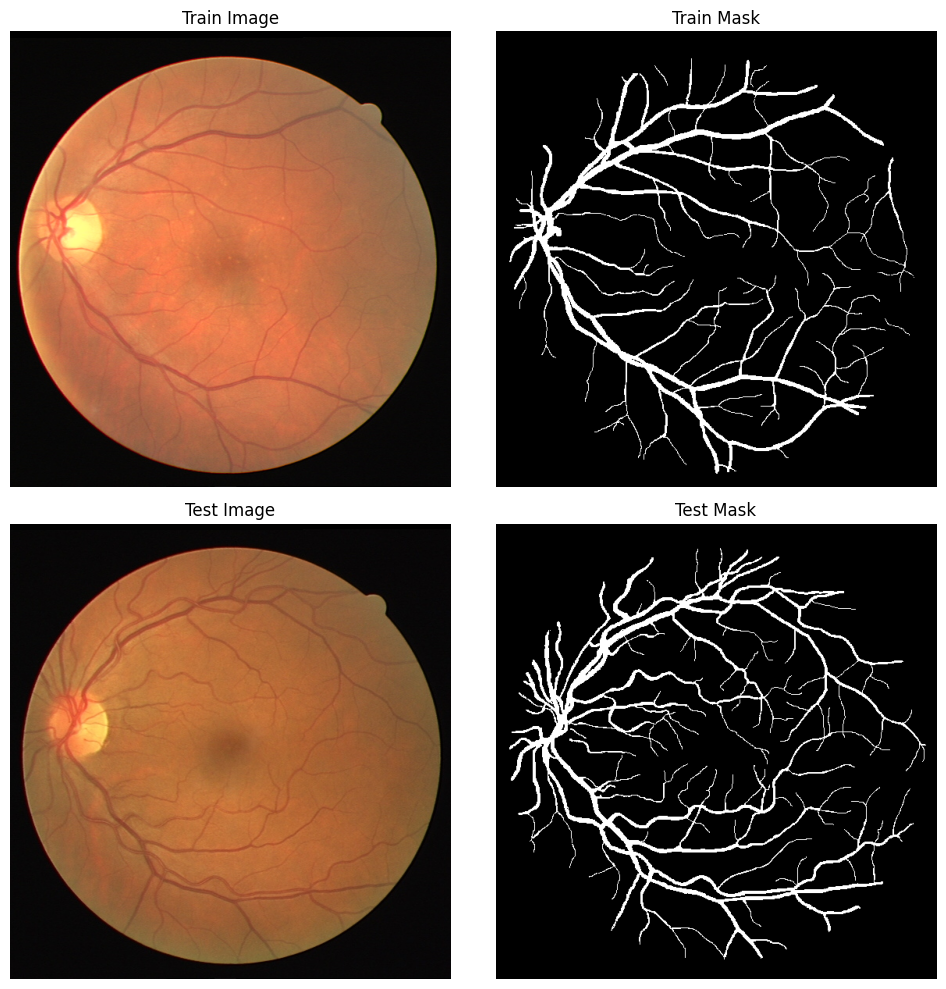

In [12]:
# Visualize the first element from each array
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Train images
axes[0, 0].imshow(train_img[0])
axes[0, 0].set_title('Train Image')
axes[0, 0].axis('off')

# Train masks
axes[0, 1].imshow(train_mask[0], cmap='gray')
axes[0, 1].set_title('Train Mask')
axes[0, 1].axis('off')

# Test images
axes[1, 0].imshow(test_img[0])
axes[1, 0].set_title('Test Image')
axes[1, 0].axis('off')

# Test masks
axes[1, 1].imshow(test_mask[0], cmap='gray')
axes[1, 1].set_title('Test Mask')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# Performing Data Augmentation on Training Images and Masks

In [5]:
# Define augmentation transforms
transforms = [
    HorizontalFlip(p=1),
    VerticalFlip(p=1),
    Rotate(limit=45, p=1) #Each transformation has a probability p set to 1, meaning they will be applied with certainty.
    #limit: This parameter defines the maximum angle range for rotation. In this case, limit=45 means that the rotation angle will be randomly chosen from the range [-45, 45] degrees. So, each image will be rotated by a random angle within this range.
]

# Function to perform augmentation on a single image and mask
def augment_image_and_mask(image, mask, transforms):
    augmented_images = [image]
    augmented_masks = [mask]

    for transform in transforms:
        augmented = transform(image=image, mask=mask)
        augmented_images.append(augmented["image"])
        augmented_masks.append(augmented["mask"])

    return augmented_images, augmented_masks

# Assuming train_images, train_masks, test_images, test_masks are your numpy arrays
train_augmented_images = []
train_augmented_masks = []
test_augmented_images = []
test_augmented_masks = []

# Augment train images and masks
for i in range(len(train_img)):
    augmented_images, augmented_masks = augment_image_and_mask(train_img[i], train_mask[i], transforms)
    
    train_augmented_images.extend(augmented_images)
    train_augmented_masks.extend(augmented_masks)
    
final_train_images = np.array(train_augmented_images)
final_train_masks = np.array(train_augmented_masks)

# Verify shapes
print("Final train images shape:", final_train_images.shape)
print("Final train masks shape:", final_train_masks.shape)

Final train images shape: (80, 584, 565, 3)
Final train masks shape: (80, 584, 565)


# Visualizing Augmented Data

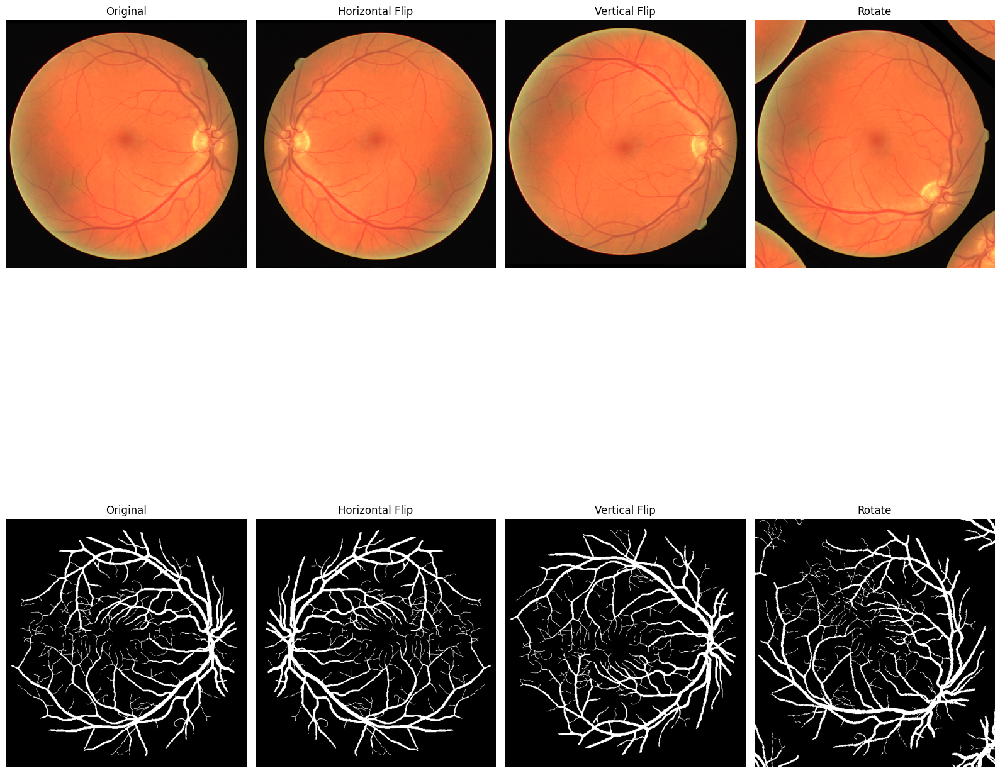

In [6]:
# Reshape the data to get 20 groups of 4 consecutive arrays
train_images_chunks = np.reshape(final_train_images, (20, 4, 584, 565, 3))
train_masks_chunks = np.reshape(final_train_masks, (20, 4, 584, 565))

# Set a fixed random seed for reproducibility
np.random.seed(44)

# Randomly pick any of the 20 chunks
chunk_index = np.random.randint(0, 20)

# Select the chunk of images and masks
chunk_images = train_images_chunks[chunk_index]
chunk_masks = train_masks_chunks[chunk_index]

# Plotting
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16, 20))

axes[0,0].imshow(chunk_images[0])
axes[0,0].set_title('Original')
axes[0,0].axis('off')
axes[0,1].imshow(chunk_images[1])
axes[0,1].set_title('Horizontal Flip')
axes[0,1].axis('off')
axes[0,2].imshow(chunk_images[2])
axes[0,2].set_title('Vertical Flip')
axes[0,2].axis('off')
axes[0,3].imshow(chunk_images[3])
axes[0,3].set_title('Rotate')
axes[0,3].axis('off')

axes[1,0].imshow(chunk_masks[0],cmap = 'gray')
axes[1,0].set_title('Original')
axes[1,0].axis('off')
axes[1,1].imshow(chunk_masks[1],cmap = 'gray')
axes[1,1].set_title('Horizontal Flip')
axes[1,1].axis('off')
axes[1,2].imshow(chunk_masks[2],cmap = 'gray')
axes[1,2].set_title('Vertical Flip')
axes[1,2].axis('off')
axes[1,3].imshow(chunk_masks[3],cmap = 'gray')
axes[1,3].set_title('Rotate')
axes[1,3].axis('off')

plt.tight_layout()
plt.show()

# Train Validation Split

In [7]:
# Set a random seed for reproducibility
seed = 42
np.random.seed(seed)

# Shuffle indices
indices = np.arange(len(final_train_images))
np.random.shuffle(indices)

# Use 80% of the data for training and 20% for validation
split = int(0.8 * len(final_train_images))
train_indices, val_indices = indices[:split], indices[split:]

# Split images and masks into train and validation sets
train_images, train_masks = final_train_images[train_indices], final_train_masks[train_indices]
val_images, val_masks = final_train_images[val_indices], final_train_masks[val_indices]

print("Train images shape:", train_images.shape)
print("Train masks shape:", train_masks.shape)
print("Validation images shape:", val_images.shape)
print("Validation masks shape:", val_masks.shape)

Train images shape: (64, 584, 565, 3)
Train masks shape: (64, 584, 565)
Validation images shape: (16, 584, 565, 3)
Validation masks shape: (16, 584, 565)


# Preparing the Dataset for Training

In [8]:
class CustomDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks
        self.n_samples = len(images)

    def __getitem__(self, index):
        image = self.images[index]
        mask = self.masks[index]

        # Resize image to 512x512
        image = cv2.resize(image, (512, 512))
        mask = cv2.resize(mask, (512, 512))

        # Reshape image to (C, H, W) format and normalize
        image = image.transpose((2, 0, 1)).astype(np.float32) / 255.0
        # Normalize mask to range [0, 1]
        mask = mask / 255.0

        # Convert to PyTorch tensors
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Add channel dimension

        return image, mask

    def __len__(self):
        return self.n_samples

# Create dataset
train_dataset = CustomDataset(images=train_images, masks=train_masks)
valid_dataset = CustomDataset(images=val_images, masks=val_masks)
test_dataset = CustomDataset(images=test_img, masks=test_mask)
# Define batch size
batch_size = 8
# Create DataLoader for training and validation datasets
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# **Training** 

In [10]:
def train(model, loader, optimizer, loss_fn, device):
    epoch_loss = 0.0

    model.train()
    # Create tqdm progress bar
    with tqdm(enumerate(loader), total=len(loader), desc="Training", unit="batch") as t:
        for _, (x, y) in t:
            x = x.to(device, dtype=torch.float32)
            y = y.to(device, dtype=torch.float32)

            optimizer.zero_grad()
            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

    epoch_loss = epoch_loss / len(loader)
    return epoch_loss

def evaluate(model, loader, loss_fn, device):
    epoch_loss = 0.0

    model.eval()
    with torch.no_grad():
        # Create tqdm progress bar
        with tqdm(enumerate(loader), total=len(loader), desc="Evaluation", unit="batch") as t:
            for _, (x, y) in t:
                x = x.to(device, dtype=torch.float32)
                y = y.to(device, dtype=torch.float32)

                y_pred = model(x)
                loss = loss_fn(y_pred, y)
                epoch_loss += loss.item()

    epoch_loss = epoch_loss / len(loader)
    return epoch_loss


# **Train Loop**

Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from inf to 1.4757. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [1/100]: Train Loss: 1.3392, Valid Loss: 1.4757


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 1.4757 to 1.4460. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [2/100]: Train Loss: 1.2275, Valid Loss: 1.4460


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 1.4460 to 1.3890. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [3/100]: Train Loss: 1.1210, Valid Loss: 1.3890


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 1.3890 to 1.3371. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [4/100]: Train Loss: 1.0496, Valid Loss: 1.3371


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 1.3371 to 1.2530. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [5/100]: Train Loss: 1.0097, Valid Loss: 1.2530


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 1.2530 to 1.0981. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [6/100]: Train Loss: 0.9801, Valid Loss: 1.0981


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Valid loss improved from 1.0981 to 0.9878. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [7/100]: Train Loss: 0.9605, Valid Loss: 0.9878


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.9878 to 0.9326. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [8/100]: Train Loss: 0.9426, Valid Loss: 0.9326


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.9326 to 0.9030. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [9/100]: Train Loss: 0.9269, Valid Loss: 0.9030


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.9030 to 0.8991. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [10/100]: Train Loss: 0.9140, Valid Loss: 0.8991


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.8991 to 0.8706. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [11/100]: Train Loss: 0.8997, Valid Loss: 0.8706


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [12/100]: Train Loss: 0.8862, Valid Loss: 0.8767


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.8706 to 0.8635. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [13/100]: Train Loss: 0.8720, Valid Loss: 0.8635


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.8635 to 0.8490. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [14/100]: Train Loss: 0.8624, Valid Loss: 0.8490


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.8490 to 0.8400. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [15/100]: Train Loss: 0.8506, Valid Loss: 0.8400


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.8400 to 0.8282. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [16/100]: Train Loss: 0.8402, Valid Loss: 0.8282


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.8282 to 0.8241. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [17/100]: Train Loss: 0.8316, Valid Loss: 0.8241


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.8241 to 0.8041. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [18/100]: Train Loss: 0.8236, Valid Loss: 0.8041


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [19/100]: Train Loss: 0.8143, Valid Loss: 0.8091


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.8041 to 0.7995. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [20/100]: Train Loss: 0.8066, Valid Loss: 0.7995


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.7995 to 0.7803. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [21/100]: Train Loss: 0.7954, Valid Loss: 0.7803


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.7803 to 0.7737. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [22/100]: Train Loss: 0.7866, Valid Loss: 0.7737


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Epoch [23/100]: Train Loss: 0.7789, Valid Loss: 0.7745


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.7737 to 0.7688. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [24/100]: Train Loss: 0.7697, Valid Loss: 0.7688


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.7688 to 0.7541. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [25/100]: Train Loss: 0.7625, Valid Loss: 0.7541


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.7541 to 0.7492. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [26/100]: Train Loss: 0.7538, Valid Loss: 0.7492


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.7492 to 0.7425. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [27/100]: Train Loss: 0.7439, Valid Loss: 0.7425


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.7425 to 0.7419. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [28/100]: Train Loss: 0.7387, Valid Loss: 0.7419


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.7419 to 0.7383. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [29/100]: Train Loss: 0.7304, Valid Loss: 0.7383


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.09batch/s]


Valid loss improved from 0.7383 to 0.7266. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [30/100]: Train Loss: 0.7212, Valid Loss: 0.7266


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.10batch/s]


Valid loss improved from 0.7266 to 0.7149. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [31/100]: Train Loss: 0.7144, Valid Loss: 0.7149


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [32/100]: Train Loss: 0.7076, Valid Loss: 0.7171


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.7149 to 0.7078. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [33/100]: Train Loss: 0.6981, Valid Loss: 0.7078


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.7078 to 0.7051. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [34/100]: Train Loss: 0.6921, Valid Loss: 0.7051


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.7051 to 0.7008. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [35/100]: Train Loss: 0.6823, Valid Loss: 0.7008


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.7008 to 0.6924. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [36/100]: Train Loss: 0.6725, Valid Loss: 0.6924


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.6924 to 0.6851. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [37/100]: Train Loss: 0.6633, Valid Loss: 0.6851


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Epoch [38/100]: Train Loss: 0.6557, Valid Loss: 0.6857


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.6851 to 0.6821. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [39/100]: Train Loss: 0.6466, Valid Loss: 0.6821


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.6821 to 0.6713. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [40/100]: Train Loss: 0.6386, Valid Loss: 0.6713


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Epoch [41/100]: Train Loss: 0.6321, Valid Loss: 0.6745


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.6713 to 0.6614. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [42/100]: Train Loss: 0.6229, Valid Loss: 0.6614


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Epoch [43/100]: Train Loss: 0.6144, Valid Loss: 0.6635


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.6614 to 0.6536. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [44/100]: Train Loss: 0.6054, Valid Loss: 0.6536


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [45/100]: Train Loss: 0.5992, Valid Loss: 0.6551


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.6536 to 0.6452. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [46/100]: Train Loss: 0.5902, Valid Loss: 0.6452


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [47/100]: Train Loss: 0.5842, Valid Loss: 0.6469


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.6452 to 0.6403. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [48/100]: Train Loss: 0.5776, Valid Loss: 0.6403


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [49/100]: Train Loss: 0.5696, Valid Loss: 0.6404


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.6403 to 0.6321. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [50/100]: Train Loss: 0.5650, Valid Loss: 0.6321


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.6321 to 0.6284. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [51/100]: Train Loss: 0.5600, Valid Loss: 0.6284


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [52/100]: Train Loss: 0.5505, Valid Loss: 0.6284


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.6284 to 0.6173. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [53/100]: Train Loss: 0.5445, Valid Loss: 0.6173


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.6173 to 0.6166. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [54/100]: Train Loss: 0.5391, Valid Loss: 0.6166


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.6166 to 0.6164. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [55/100]: Train Loss: 0.5302, Valid Loss: 0.6164


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.6164 to 0.6059. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [56/100]: Train Loss: 0.5256, Valid Loss: 0.6059


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Epoch [57/100]: Train Loss: 0.5207, Valid Loss: 0.6086


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.6059 to 0.6051. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [58/100]: Train Loss: 0.5146, Valid Loss: 0.6051


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.6051 to 0.5958. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [59/100]: Train Loss: 0.5096, Valid Loss: 0.5958


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Epoch [60/100]: Train Loss: 0.5043, Valid Loss: 0.5964


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5958 to 0.5898. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [61/100]: Train Loss: 0.4995, Valid Loss: 0.5898


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5898 to 0.5875. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [62/100]: Train Loss: 0.4934, Valid Loss: 0.5875


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [63/100]: Train Loss: 0.4912, Valid Loss: 0.5946


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.5875 to 0.5857. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [64/100]: Train Loss: 0.4842, Valid Loss: 0.5857


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5857 to 0.5838. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [65/100]: Train Loss: 0.4796, Valid Loss: 0.5838


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.5838 to 0.5807. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [66/100]: Train Loss: 0.4729, Valid Loss: 0.5807


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5807 to 0.5702. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [67/100]: Train Loss: 0.4693, Valid Loss: 0.5702


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Valid loss improved from 0.5702 to 0.5691. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [68/100]: Train Loss: 0.4624, Valid Loss: 0.5691


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5691 to 0.5620. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [69/100]: Train Loss: 0.4566, Valid Loss: 0.5620


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [70/100]: Train Loss: 0.4527, Valid Loss: 0.5638


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Valid loss improved from 0.5620 to 0.5568. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [71/100]: Train Loss: 0.4475, Valid Loss: 0.5568


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.23batch/s]


Epoch [72/100]: Train Loss: 0.4428, Valid Loss: 0.5580


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Valid loss improved from 0.5568 to 0.5481. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [73/100]: Train Loss: 0.4375, Valid Loss: 0.5481


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.10batch/s]


Epoch [74/100]: Train Loss: 0.4337, Valid Loss: 0.5540


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5481 to 0.5476. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [75/100]: Train Loss: 0.4292, Valid Loss: 0.5476


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Valid loss improved from 0.5476 to 0.5447. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [76/100]: Train Loss: 0.4231, Valid Loss: 0.5447


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Epoch [77/100]: Train Loss: 0.4215, Valid Loss: 0.5462


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5447 to 0.5414. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [78/100]: Train Loss: 0.4191, Valid Loss: 0.5414


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5414 to 0.5412. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [79/100]: Train Loss: 0.4127, Valid Loss: 0.5412


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5412 to 0.5383. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [80/100]: Train Loss: 0.4084, Valid Loss: 0.5383


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.15batch/s]


Valid loss improved from 0.5383 to 0.5344. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [81/100]: Train Loss: 0.4039, Valid Loss: 0.5344


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Valid loss improved from 0.5344 to 0.5287. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [82/100]: Train Loss: 0.4003, Valid Loss: 0.5287


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.11batch/s]


Epoch [83/100]: Train Loss: 0.3974, Valid Loss: 0.5321


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Epoch [84/100]: Train Loss: 0.3964, Valid Loss: 0.5291


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5287 to 0.5262. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [85/100]: Train Loss: 0.3902, Valid Loss: 0.5262


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.5262 to 0.5205. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [86/100]: Train Loss: 0.3868, Valid Loss: 0.5205


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5205 to 0.5185. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [87/100]: Train Loss: 0.3834, Valid Loss: 0.5185


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5185 to 0.5168. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [88/100]: Train Loss: 0.3815, Valid Loss: 0.5168


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.18batch/s]


Valid loss improved from 0.5168 to 0.5134. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [89/100]: Train Loss: 0.3769, Valid Loss: 0.5134


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.13batch/s]


Epoch [90/100]: Train Loss: 0.3745, Valid Loss: 0.5221


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [91/100]: Train Loss: 0.3705, Valid Loss: 0.5150


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.17batch/s]


Valid loss improved from 0.5134 to 0.5098. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [92/100]: Train Loss: 0.3677, Valid Loss: 0.5098


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Valid loss improved from 0.5098 to 0.5047. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [93/100]: Train Loss: 0.3640, Valid Loss: 0.5047


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.14batch/s]


Epoch [94/100]: Train Loss: 0.3610, Valid Loss: 0.5073


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.16batch/s]


Valid loss improved from 0.5047 to 0.4974. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [95/100]: Train Loss: 0.3564, Valid Loss: 0.4974


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.19batch/s]


Epoch [96/100]: Train Loss: 0.3526, Valid Loss: 0.5046


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.21batch/s]


Epoch [97/100]: Train Loss: 0.3507, Valid Loss: 0.5048


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.22batch/s]


Valid loss improved from 0.4974 to 0.4969. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [98/100]: Train Loss: 0.3466, Valid Loss: 0.4969


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.12batch/s]


Epoch [99/100]: Train Loss: 0.3444, Valid Loss: 0.4986


Evaluation: 100%|██████████| 2/2 [00:00<00:00,  3.20batch/s]


Valid loss improved from 0.4969 to 0.4880. Saving checkpoint: /kaggle/working/model_checkpoint.pth
Epoch [100/100]: Train Loss: 0.3407, Valid Loss: 0.4880


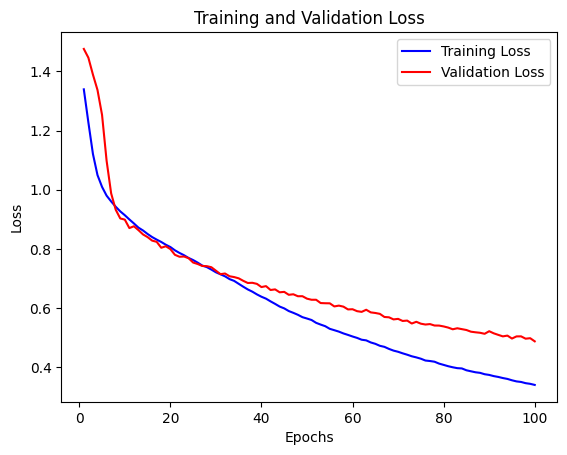

CPU times: user 13min 48s, sys: 36.1 s, total: 14min 24s
Wall time: 13min 6s


In [11]:
%%time
np.random.seed(42)

t_loss = []
v_loss = []
num_epochs = 100
lr = 1e-4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = U_Net()
model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, verbose=True)
loss_fn = DiceBCELoss()

""" Training the model """
best_valid_loss = float("inf")

for epoch in range(num_epochs):
    
    train_loss = train(model, train_loader, optimizer, loss_fn, device)
    valid_loss = evaluate(model, valid_loader, loss_fn, device)
    scheduler.step(valid_loss)
    t_loss.append(train_loss)
    v_loss.append(valid_loss)

    """ Saving the model """
    if valid_loss < best_valid_loss:
        checkpoint_path = "/kaggle/working/model_checkpoint.pth"
        print(f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving checkpoint: {checkpoint_path}")
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), checkpoint_path)

    # Print train and validation loss after each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}]: Train Loss: {train_loss:.4f}, Valid Loss: {valid_loss:.4f}")

plt.plot(range(1, num_epochs + 1), t_loss, 'b', label='Training Loss')
plt.plot(range(1, num_epochs + 1), v_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **Loading the Trained Model**

In [10]:
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = U_Net()
    model = model.to(device)
    model.load_state_dict(torch.load("/kaggle/input/model-unet/model_checkpoint.pth", map_location=device))

<All keys matched successfully>

# **Evaluating Our Model**

In [16]:
# Initialize lists to store evaluation metrics
accuracy_list, f1_list, jaccard_list, recall_list, precision_list, dice_list = [], [], [], [], [], []

# Set model to evaluation mode
model.eval()

# Iterate through the test loader
for images, masks in test_loader:
    images = images.to(device)
    masks = masks > 0.5
    # Forward pass to obtain predicted masks
    with torch.no_grad():
        outputs = model(images)
        outputs = torch.sigmoid(outputs)
        outputs = outputs > 0.5
    
    # Convert predicted masks and ground truth masks to numpy arrays
    predicted_masks = outputs.cpu().numpy()
    true_masks = masks.numpy()
    
    
    # Iterate through each image in the batch
    for i in range(len(images)):
        # Store predicted and ground truth masks
        predicted_mask = predicted_masks[i][0]
        ground_truth_mask = true_masks[i][0]
        
        # Calculate evaluation metrics
        accuracy = accuracy_score(ground_truth_mask.flatten(), predicted_mask.flatten())
        f1 = f1_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        jaccard = jaccard_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary') #intersection over union
        recall = recall_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        precision = precision_score(ground_truth_mask.flatten(), predicted_mask.flatten(), average='binary')
        
        # Calculate dice coefficient (also known as F1 score)
        dice_coefficient = 2 * (np.sum(predicted_mask * ground_truth_mask)) / (np.sum(predicted_mask) + np.sum(ground_truth_mask))
        
        # Append evaluation metrics to lists
        accuracy_list.append(accuracy)
        f1_list.append(f1)
        jaccard_list.append(jaccard)
        recall_list.append(recall)
        precision_list.append(precision)
        dice_list.append(dice_coefficient)

accuracy_mean = np.mean(accuracy_list)
f1_mean = np.mean(f1_list)
jaccard_mean = np.mean(jaccard_list)
recall_mean = np.mean(recall_list)
precision_mean = np.mean(precision_list)
dice_mean = np.mean(dice_list)

print("Mean Accuracy: {:.2f}".format(accuracy_mean))
print("Mean F1 Score: {:.2f}".format(f1_mean))
print("Mean Jaccard Score: {:.2f}".format(jaccard_mean))
print("Mean Recall: {:.2f}".format(recall_mean))
print("Mean Precision: {:.2f}".format(precision_mean))
print("Mean Dice Coefficient: {:.2f}".format(dice_mean))

Mean Accuracy: 0.96
Mean F1 Score: 0.79
Mean Jaccard Score: 0.65
Mean Recall: 0.79
Mean Precision: 0.79
Mean Dice Coefficient: 0.79


# **Visualizing Model Predictions**

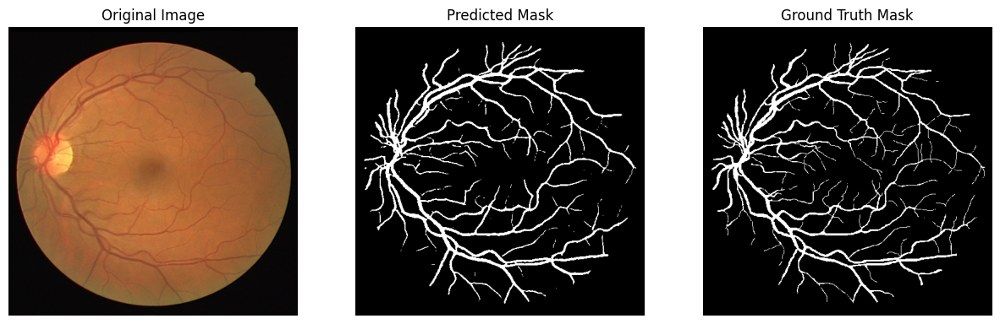

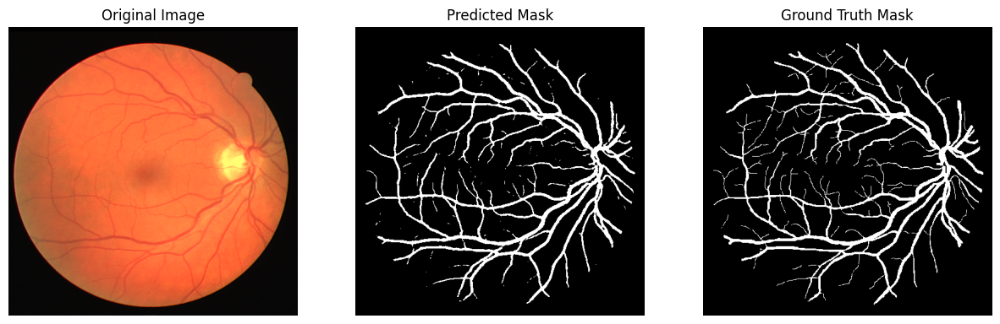

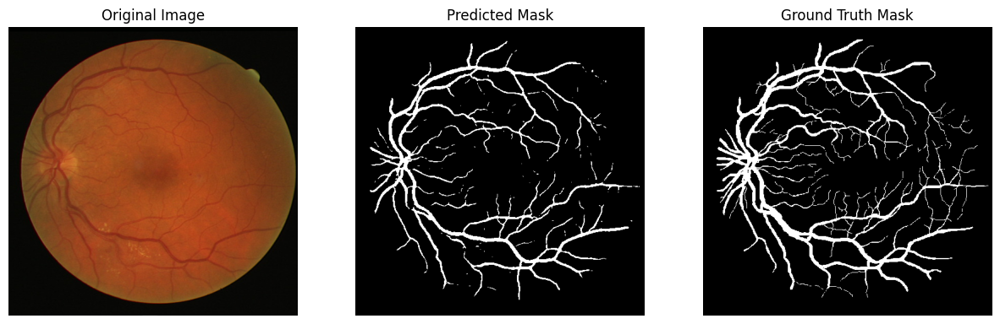

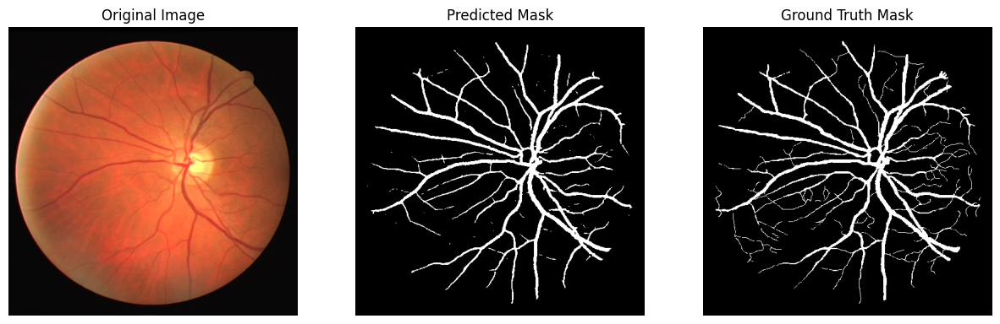

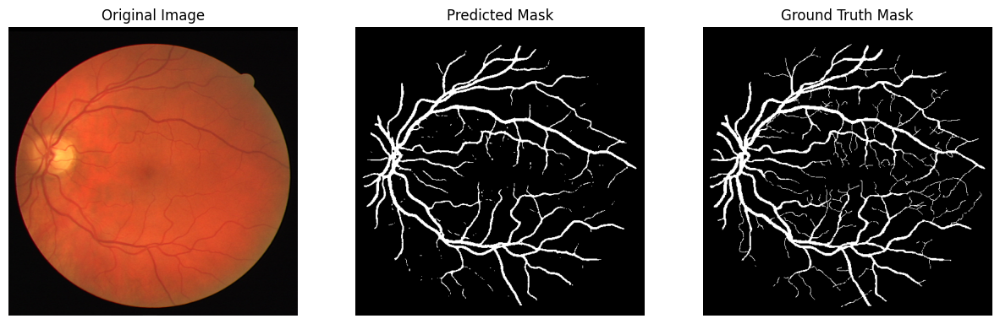

...

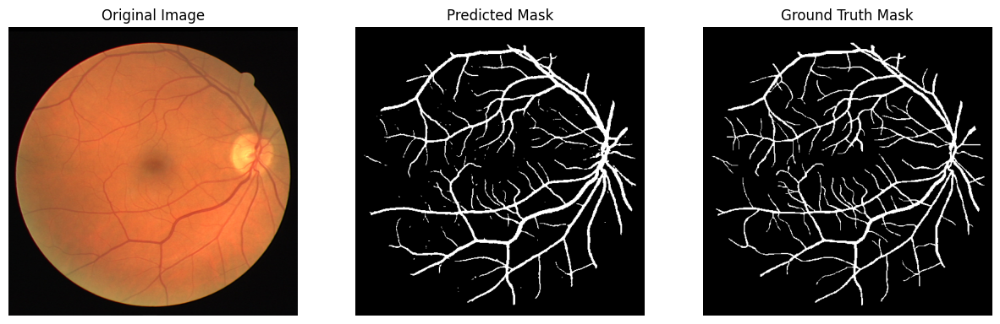

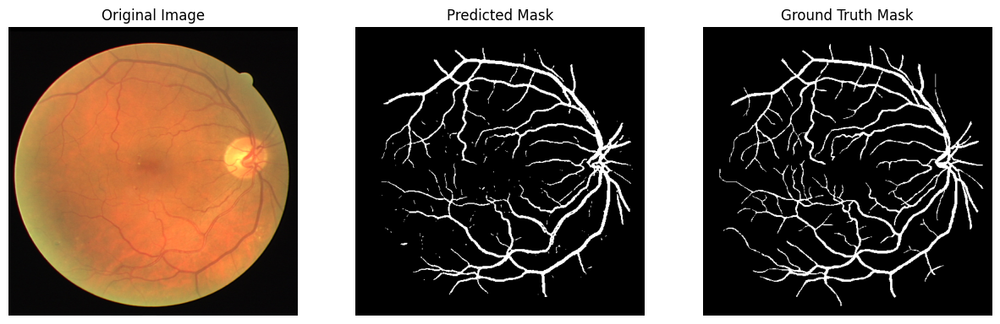

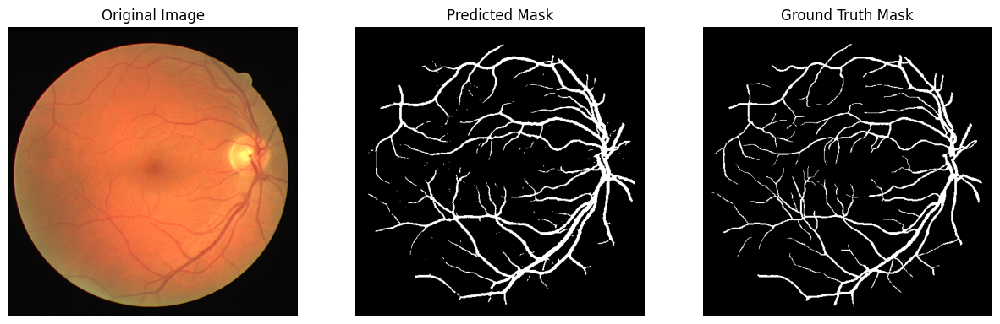

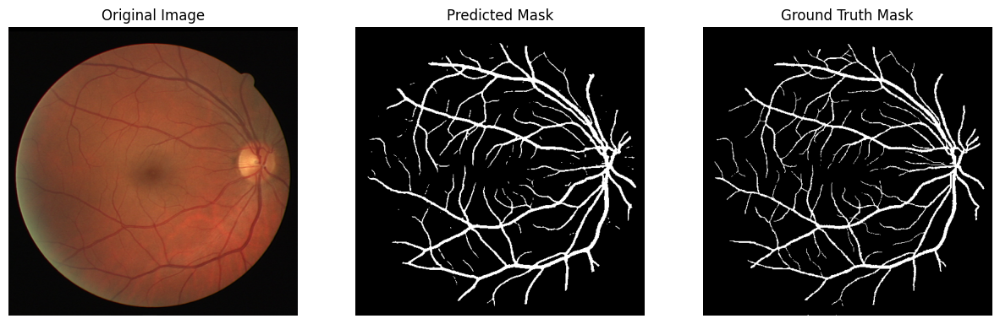

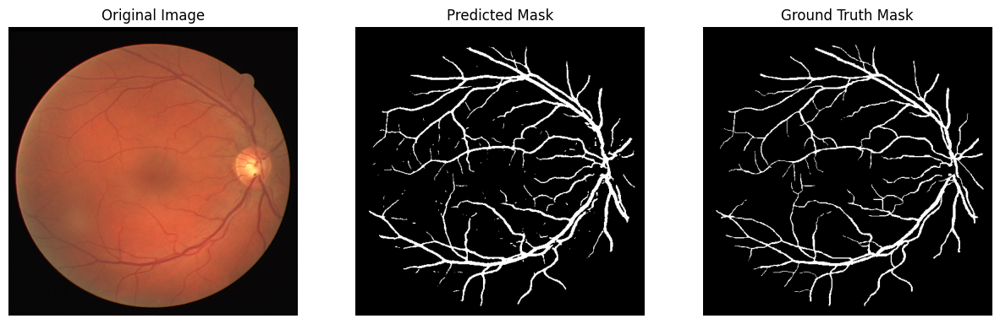

In [17]:
# Set model to evaluation mode
model.eval()

# Iterate through the test loader
for images, masks in test_loader:
    images = images.to(device)
    
    # Forward pass to obtain predicted masks
    with torch.no_grad():
        outputs = model(images)
        outputs = torch.sigmoid(outputs)
        outputs = outputs > 0.5
    
    # Convert predicted masks and ground truth masks to numpy arrays
    predicted_masks = outputs.cpu().numpy()
    masks = masks>0.5
    true_masks = masks.numpy()
    
    # Visualize original images, predicted masks, and ground truth masks
    for i in range(len(images)):
        plt.figure(figsize=(15, 5))
        
        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(images[i].permute(1, 2, 0).cpu())
        plt.title("Original Image")
        plt.axis('off')
        
        # Predicted mask
        plt.subplot(1, 3, 2)
        plt.imshow(predicted_masks[i][0], cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')
        
        # Ground truth mask
        plt.subplot(1, 3, 3)
        plt.imshow(true_masks[i][0], cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')
        
        plt.show()